<font color = "blue">**Causal Discovery from Data Assisted by Large Language Models**</font>

## **Download pachages**

In [ ]:
! gdown --id 1gizuKTMdX_uZ3L6lsYTer51B42fgwHRo

In [ ]:
# ! pip install langchain
# ! pip install -U langchain-community
# ! pip install arxiv
# ! pip install openai
# ! pip install gcastle==1.0.4rc1
# ! pip install lingam
# ! pip install wget

In [11]:
import os
from itertools import combinations
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd
from scipy import linalg
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt

In [10]:
from langchain_openai import ChatOpenAI
from langchain_community.tools import DuckDuckGoSearchRun
# from langchain.agents.react.agent import create_react_agent
# from langchain.agents import AgentExecutor
# from langchain.prompts import PromptTemplate


In [2]:
from castle.common import GraphDAG
from castle.metrics import MetricsDAG
from castle.algorithms import PC
from castle.common.priori_knowledge import PrioriKnowledge
from lingam.utils import print_causal_directions, print_dagc, make_dot

In [7]:
import networkx as nx
import numpy as np
import cv2
import h5py
import wget
import matplotlib.patches as pch
from sklearn import decomposition
from scipy import signal
import matplotlib.patches as patches
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from skimage import feature
import skimage
save_results = False
import matplotlib.colors as mcolors

# try:
#     import colorspacious
# except ModuleNotFoundError:
#     !pip install colorspacious
#     import colorspacious



In [8]:
import torch
import random

# Setting seeds to reproduce the results
torch.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic=True
np.random.seed(0)
random.seed(0)

Initiate API Key

In [ ]:
# your API key here

## Download SmBFO data

In [ ]:
# os.makedirs("data", exist_ok = True)

In [ ]:
# model_files = [
#     'Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
#     'Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
#     'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5','Sm_7_2_HAADF.h5','Sm_7_3_HAADF.h5','Sm_7_4_HAADF.h5',
#     'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
#     'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
#     'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
#     'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
#     'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
#     'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5',
#     'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5'
# ]

# base_url = "https://zenodo.org/record/4555979/files/"

# for model_file in model_files:
#     url = f"{base_url}{model_file}?download=1"
#     output_path = os.path.join("data", model_file)
#     print(f"Downloading {model_file}")
#     wget.download(url, out=output_path)
#     print()


**Data preparation**

In [ ]:
# #list files
# filedir = 'data'
# [f for f in os.listdir(filedir)]

['Sm_7_1_UCParameterization.h5',
 'Sm_7_3_HAADF.h5',
 'Sm_7_2_HAADF.h5',
 'Sm_13_1_UCParameterization.h5',
 'Sm_7_3_UCParameterization.h5',
 'Sm_0_1_UCParameterization.h5',
 'Sm_7_4_HAADF.h5',
 'Sm_13_1_HAADF.h5',
 'Sm_13_0_HAADF.h5',
 'Sm_10_1_UCParameterization.h5',
 'Sm_0_2_HAADF.h5',
 'Sm_20_0_UCParameterization.h5',
 'Sm_7_0_UCParameterization.h5',
 'Sm_7_0_HAADF.h5',
 'Sm_7_1_HAADF.h5',
 'Sm_7_2_UCParameterization.h5',
 'Sm_10_1_HAADF.h5',
 'SM_10_0_HAADF.h5',
 'Sm_13_0_UCParameterization.h5',
 'Sm_10_0_UCParameterization.h5',
 'Sm_0_0_UCParameterization.h5',
 'Sm_20_1_HAADF.h5',
 'Sm_20_0_HAADF.h5',
 'Sm_7_4_UCParameterization.h5',
 'Sm_20_1_UCParameterization.h5',
 'Sm_0_1_HAADF.h5',
 'Sm_0_0_HAADF.h5',
 'Sm_0_2_UCParameterization.h5']

In [ ]:
# #image files
# composition_tags = [0,0,0,7,7,7,7,7,10,10,13,13,20,20]    #Sm composition %


# img_filename = ['Sm_0_0_HAADF.h5','Sm_0_1_HAADF.h5','Sm_0_2_HAADF.h5',
#                 'Sm_7_0_HAADF.h5','Sm_7_1_HAADF.h5', 'Sm_7_2_HAADF.h5', 'Sm_7_3_HAADF.h5', 'Sm_7_4_HAADF.h5',
#                 'SM_10_0_HAADF.h5','Sm_10_1_HAADF.h5',
#                 'Sm_13_0_HAADF.h5','Sm_13_1_HAADF.h5',
#                 'Sm_20_0_HAADF.h5','Sm_20_1_HAADF.h5']

# imnum = len(img_filename)

# #paramterization files

# UCparam_filename = ['Sm_0_0_UCParameterization.h5','Sm_0_1_UCParameterization.h5','Sm_0_2_UCParameterization.h5',
#                     'Sm_7_0_UCParameterization.h5','Sm_7_1_UCParameterization.h5','Sm_7_2_UCParameterization.h5','Sm_7_3_UCParameterization.h5','Sm_7_4_UCParameterization.h5',
#                     'Sm_10_0_UCParameterization.h5','Sm_10_1_UCParameterization.h5',
#                     'Sm_13_0_UCParameterization.h5','Sm_13_1_UCParameterization.h5',
#                     'Sm_20_0_UCParameterization.h5','Sm_20_1_UCParameterization.h5']

# #load parameter files
# UCparam = []
# for x in UCparam_filename:
#   print('loading parameterization file: ', os.path.join(filedir, x))
#   temp = h5py.File(os.path.join(filedir, x), 'r')
#   UCparam.append(temp)


# #load images
# imgdata = []
# for x in img_filename:
#   print('loading image file: ', os.path.join(filedir, x))
#   temp = h5py.File(os.path.join(filedir, x), 'r')['MainImage']
#   imgdata.append(temp)

# print('UC parameterization:', [k for k in UCparam[0].keys()])

loading parameterization file:  data/Sm_0_0_UCParameterization.h5
loading parameterization file:  data/Sm_0_1_UCParameterization.h5
loading parameterization file:  data/Sm_0_2_UCParameterization.h5
loading parameterization file:  data/Sm_7_0_UCParameterization.h5
loading parameterization file:  data/Sm_7_1_UCParameterization.h5
loading parameterization file:  data/Sm_7_2_UCParameterization.h5
loading parameterization file:  data/Sm_7_3_UCParameterization.h5
loading parameterization file:  data/Sm_7_4_UCParameterization.h5
loading parameterization file:  data/Sm_10_0_UCParameterization.h5
loading parameterization file:  data/Sm_10_1_UCParameterization.h5
loading parameterization file:  data/Sm_13_0_UCParameterization.h5
loading parameterization file:  data/Sm_13_1_UCParameterization.h5
loading parameterization file:  data/Sm_20_0_UCParameterization.h5
loading parameterization file:  data/Sm_20_1_UCParameterization.h5
loading image file:  data/Sm_0_0_HAADF.h5
loading image file:  data/Sm

In [ ]:
# #function maps x,y grid positions into a matrix data format
# def map2grid(inab, inVal):

#   default_val = np.nan
#   abrng = [int(np.min(inab[:,0])), int(np.max(inab[:,0])), int(np.min(inab[:,1])), int(np.max(inab[:,1]))]
#   abind = inab
#   abind[:,0] -= abrng[0]
#   abind[:,1] -= abrng[2]
#   Valgrid = np.empty((abrng[1]-abrng[0]+1,abrng[3]-abrng[2]+1))
#   Valgrid[:] = default_val
#   Valgrid[abind[:,0].astype(int),abind[:,1].astype(int)]=inVal[:]
#   return Valgrid, abrng

In [ ]:
# SBFOdata = []                       #this will be the output list of dictionaries for each dataset
# for i in np.arange(imnum):
#   temp_dict = {'Index': i}
#   temp_dict['Composition'] = composition_tags[i]
#   temp_dict['Image'] = imgdata[i]
#   temp_dict['Filename'] = img_filename[i]
#   for k in UCparam[i].keys():       #add labels for UC parameterization
#     temp_dict[k] = UCparam[i][k][()]

#   #select values mapped to ab grid
#   temp_dict['ab_a'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,0])[0]       #a array
#   temp_dict['ab_b'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['ab'][()].T[:,1])[0]       #b array
#   temp_dict['ab_x'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,0])[0]   #x array
#   temp_dict['ab_y'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['xy_COM'][()].T[:,1])[0]   #y array
#   temp_dict['ab_Px'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][0])[0]             #Px array
#   temp_dict['ab_Py'] = map2grid(UCparam[i]['ab'][()].T, UCparam[i]['Pxy'][1])[0]             #Py array

#   SBFOdata.append(temp_dict)

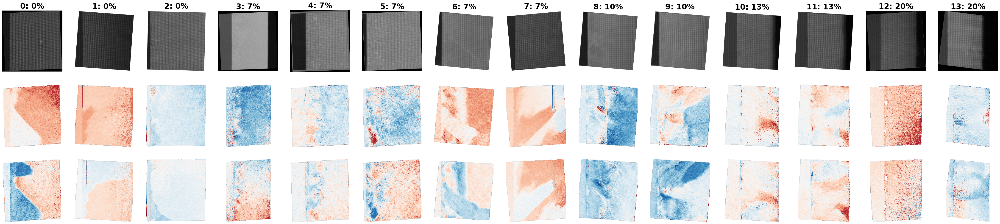

In [ ]:
# fig, ax = plt.subplots(nrows=3, ncols=len(SBFOdata), figsize=(4*len(SBFOdata), 4*3), dpi=100)
# for i, k in enumerate(SBFOdata):
#   #Image
#   ax[0,i].imshow(k['Image'], origin='upper', cmap='gray')
#   ax[0,i].set_title(str(k['Index'])+': '+str(k['Composition'])+'%', fontsize = 24, fontweight = "bold")
#   ax[0,i].set_axis_off()
#   #Px
#   ax[1,i].imshow(k['ab_Px'], origin='upper', cmap='RdBu')
#   ax[1,i].set_axis_off()
#   #Py
#   ax[2,i].imshow(k['ab_Py'], origin='upper', cmap='RdBu')
#   ax[2,i].set_axis_off()

## **Define parameters of interest**

In [46]:
# SmBFOdata = np.array(SBFOdata)
# SmBFOdata = np.array([np.array(x) for x in SBFOdata])
# SmBFOdata[0]

In [ ]:
# def convert_entry(entry):
#     entry = entry.item()          # 🔑 unwrap 0-d numpy object
#     entry = dict(entry)           # copy dict
#     if "Image" in entry:
#         entry["Image"] = entry["Image"][:]   # HDF5 → NumPy
#     return entry

# SmBFOdata_clean = np.array(
#     [convert_entry(e) for e in SmBFOdata],
#     dtype=object
# )




In [47]:
# np.savez("SmBFOdata.npz", SmBFOdata=SmBFOdata_clean)

In [48]:
data = np.load("SmBFOdata.npz", allow_pickle=True)
SmBFOdata = data["SmBFOdata"]

In [41]:
SmBFOdata

NpzFile 'SmBFOdata.npz' with keys: SmBFOdata

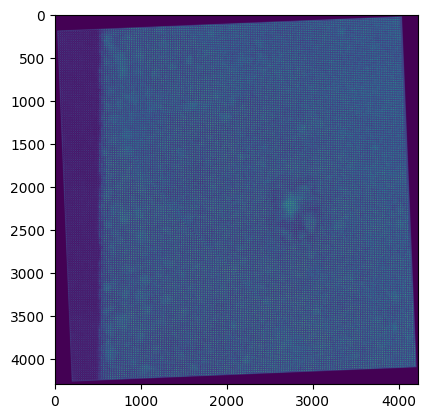

In [43]:
plt.imshow(SmBFOdata[0]["Image"])

In [44]:
file_path = "SmBFOdata.npz"
size_bytes = os.path.getsize(file_path)

print(f"Size: {size_bytes / (1024**2):.2f} MB")

Size: 2193.52 MB


In [ ]:
for entry in SBFOdata:  # Assuming `your_array` is the name of your data
    print(entry.keys())

In [ ]:
# # Function to extract mean values from arrays in SBFOdata
def extract_mean_values(entry):
     return {
        'Alkali_Cations': np.nanmean(entry['I1']),
        'Transition_Metal_Cations': np.nanmean(entry['I5']),
        'Lattice_Parameter': np.nanmean(entry['a']),
        'Composition': np.nanmean(entry['Composition']),
        'Unit_Cell_Angle': np.nanmean(entry['alpha']),
        'Volume': np.nanmean(entry['Vol']),
        'In_Plane_Polarization': np.nanmean(entry['Pxy'][0]),  # Assuming Px is the first component of Pxy
#         'Py': np.nanmean(entry['Pxy'][1])   # Assuming Py is the second component of Pxy
    }

# Extract relevant data and handle NaNs and inf values
data_entries = []
for entry in SBFOdata:
    data_entries.append(extract_mean_values(entry))

# Convert to DataFrame
df = pd.DataFrame(data_entries).replace([np.inf, -np.inf], np.nan).dropna()

# Ensure no extremely large values
max_value = np.finfo(np.float64).max
df = df.clip(upper=max_value)

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)

In [ ]:
def extract_physical_values(entry):
    return {
        'Alkali_Cations': entry['I1'].flatten(),
        'Transition_Metal_Cations': entry['I5'].flatten(),
        'Lattice_Parameter': entry['a'].flatten(),
        'Composition': entry['Composition'],  # No flattening needed
        'Unit_Cell_Angle': entry['alpha'].flatten(),
        'Volume': entry['Vol'].flatten(),
        'In_Plane_Polarization': entry['Pxy'][0].flatten(),
    }

data_entries = []
for entry in SBFOdata:
    extracted = extract_physical_values(entry)
    for i in range(len(extracted['Alkali_Cations'])):
        data_entries.append({
            'Alkali_Cations': extracted['Alkali_Cations'][i],
            'Transition_Metal_Cations': extracted['Transition_Metal_Cations'][i],
            'Lattice_Parameter': extracted['Lattice_Parameter'][i],
            'Composition': extracted['Composition'],
            'Unit_Cell_Angle': extracted['Unit_Cell_Angle'][i],
            'Volume': extracted['Volume'][i],
            'In_Plane_Polarization': extracted['In_Plane_Polarization'][i],
            # 'In_Plane_Polarization_Y': extracted['In_Plane_Polarization_Y'][i]
        })

# Convert to DataFrame
df = pd.DataFrame(data_entries).replace([np.inf, -np.inf], np.nan).dropna()

# Ensure no extremely large values
max_value = np.finfo(np.float64).max
df = df.clip(upper=max_value)

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df)


In [ ]:
all_vars = {
    'Alkali_Cations': 0,
    'Transition_Metal_Cations': 1,
    'Lattice_Parameter': 2,
    'Composition': 3,  # Placeholder for the missing index
    'Unit_Cell_Angle': 4,
    'Volume': 5,
    'In_Plane_Polarization': 6
}

In [ ]:
# Create the inverse mapping from indices to variable names
inverse_var_map = {v: k for k, v in all_vars.items()}

## **PC discovery without LLM assist**
**gcastle**

In [ ]:
# PC discovery without LLM assist
pc = PC(variant='stable')
pc.learn(scaled_data)

# Create the inverse mapping from indices to variable names
inverse_var_map = {v: k for k, v in all_vars.items()}

# Replace the indices with variable names in the DAG matrix
labels = [inverse_var_map[i] for i in range(pc.causal_matrix.shape[0])]
pc_dag_named = pd.DataFrame(pc.causal_matrix, index=labels, columns=labels)

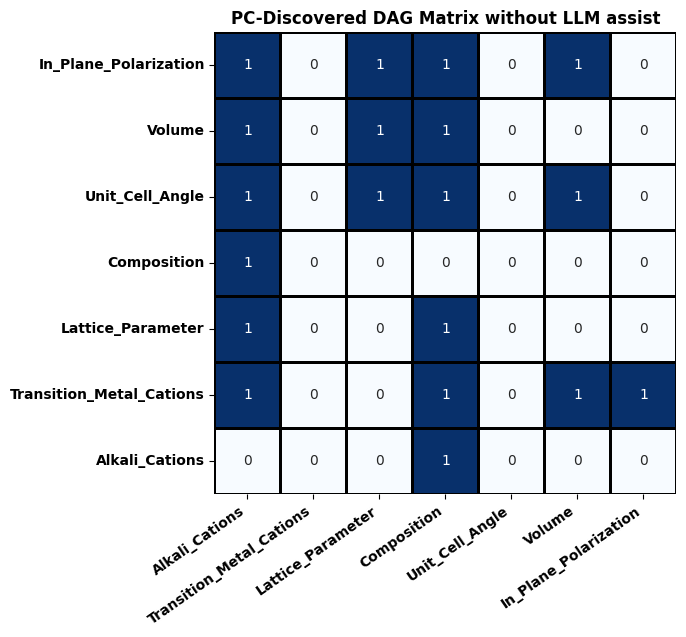

In [ ]:
# Plot the DAG matrix with names using seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(pc_dag_named, annot=True, cmap='Blues', cbar=False, square=True, linewidths=.8, linecolor='black')
plt.title('PC-Discovered DAG Matrix without LLM assist', fontsize=12, fontweight='bold')
plt.xticks(rotation=35, ha='right', fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

# Invert the y-axis
plt.gca().invert_yaxis()

plt.show()

Real names

In [ ]:
# # Define the updated variable names (real values)
# all_vars_real = {
#     '$I_{14}$': 0,
#     '$I_5$': 1,
#     'a': 2,
#     'c': 3,
#     'α': 4,
#     'Vol': 5,
#     '$P_x$': 6
# }

# # Create the inverse mapping for real variable names
# inverse_var_map_real = {v: k for k, v in all_vars_real.items()}

# # Example DAG matrix (Replace this with your real data)
# pc_dag_real = np.array([
#     [0, 0, 0, 1, 0, 0, 0],
#     [1, 0, 0, 1, 0, 1, 1],
#     [1, 0, 0, 1, 0, 0, 0],
#     [1, 0, 0, 0, 0, 0, 0],
#     [1, 0, 1, 1, 0, 1, 0],
#     [1, 0, 1, 1, 0, 0, 0],
#     [1, 0, 1, 1, 0, 1, 0]
# ])

# # Plot the DAG matrix with real names using seaborn heatmap
# plt.figure(figsize=(6, 6), dpi = 1000)
# sns.heatmap(
#     pc_dag_real,
#     annot=True,
#     cmap=sns.color_palette(["white", "lightblue"]),  # Custom color for 1 values
#     cbar=False,  # No color bar since it's binary
#     square=True,
#     xticklabels=inverse_var_map_real.values(),
#     yticklabels=inverse_var_map_real.values(),
#     linewidths=.5,
#     linecolor='black',
#     annot_kws={"size": 10, "weight": "bold"},
#     fmt='d'
# )
# # plt.title('PC-Discovered DAG', fontsize=12, fontweight='bold')
# plt.xticks(rotation=0, ha='right', fontsize=14, fontweight='bold')
# plt.yticks(rotation=0, fontsize=14, fontweight='bold')

# # Invert the y-axis
# plt.gca().invert_yaxis()

# plt.show()

## **Causal discovery LLM assited**

In [ ]:
# Instantiate the LLM
# llm = ChatOpenAI(temperature=0, model='gpt-4')
llm = ChatOpenAI(temperature=0, model='gpt-4-turbo')

# Load tools for LangChain
tools = load_tools(["arxiv"], llm=llm)

# Initialize the agent
agent = initialize_agent(tools, llm, agent=AgentType.CHAT_ZERO_SHOT_REACT_DESCRIPTION, handle_parsing_errors=True, verbose=False)

# Define a function to query the LLM for causal relationships
def get_llm_info(llm, agent, var_1, var_2):
    out = agent(f"Does {var_1} cause {var_2} or the other way around? We assume the following definition of causation: if we change A, B will also change. The relationship does not have to be linear or monotonic. We are interested in all types of causal relationships, including partial and indirect relationships, given that our definition holds.")
    print(out)
    pred = llm.predict(f'We assume the following definition of causation: if we change A, B will also change. Based on the following information: {out["output"]}, print (0,1) if {var_1} causes {var_2}, print (1, 0) if {var_2} causes {var_1}, print (0,0) if there is no causal relationship between {var_1} and {var_2}. Finally, print (-1, -1) if you don\'t know. Importantly, don\'t try to make up an answer if you don\'t know.')
    print(pred)
    return pred

priori_knowledge = PrioriKnowledge(n_nodes=len(all_vars))

for var_1, var_2 in combinations(all_vars.keys(), r=2):
    print(var_1, var_2)
    out = get_llm_info(llm, agent, var_1, var_2)
    if out == '(0,1)':
        priori_knowledge.add_required_edges([(all_vars[var_1], all_vars[var_2])])
        priori_knowledge.add_forbidden_edges([(all_vars[var_2], all_vars[var_1])])
    elif out == '(1,0)':
        priori_knowledge.add_required_edges([(all_vars[var_2], all_vars[var_1])])
        priori_knowledge.add_forbidden_edges([(all_vars[var_1], all_vars[var_2])])

Alkali_Cations Transition_Metal_Cations
{'input': 'Does Alkali_Cations cause Transition_Metal_Cations or the other way around? We assume the following definition of causation: if we change A, B will also change. The relationship does not have to be linear or monotonic. We are interested in all types of causal relationships, including partial and indirect relationships, given that our definition holds.', 'output': 'Based on the scientific literature reviewed, there is no evidence to suggest a direct causal relationship where alkali cations cause changes in transition metal cations or vice versa. The interactions between these cations in various materials do not clearly fit the definition of causation provided.'}
(0,0)
Alkali_Cations Lattice_Parameter
{'input': 'Does Alkali_Cations cause Lattice_Parameter or the other way around? We assume the following definition of causation: if we change A, B will also change. The relationship does not have to be linear or monotonic. We are interested

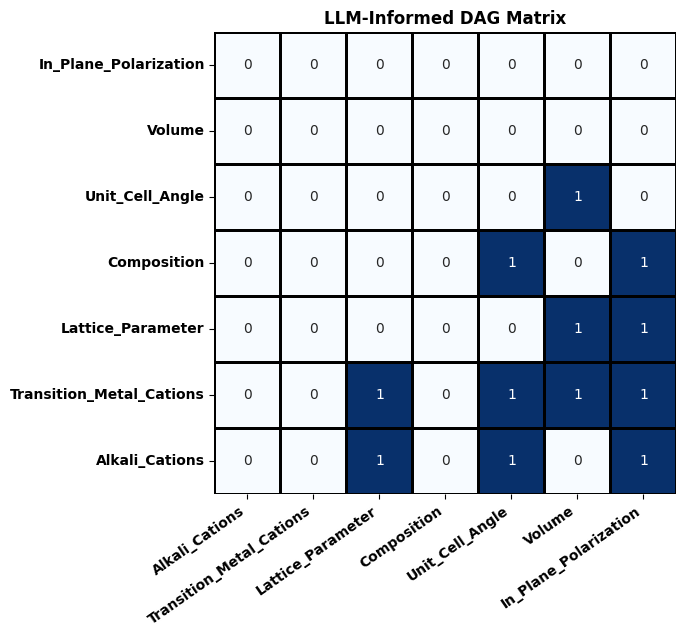

In [ ]:
# Generate the LLM-informed DAG matrix
priori_dag = np.clip(priori_knowledge.matrix, 0, 1)

# Create the inverse mapping from indices to variable names
inverse_var_map = {v: k for k, v in all_vars.items()}

# Replace the indices with variable names in the DAG matrix
labels_llm = [inverse_var_map[i] for i in range(priori_dag.shape[0])]
priori_dag_named_llm = pd.DataFrame(priori_dag, index=labels_llm, columns=labels_llm)

#Plot the DAG matrix with names using seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(priori_dag_named_llm, annot=True, cmap='Blues', cbar=False, square=True, linewidths=.8, linecolor='black')
# Customize the plot with titles and labels
plt.title('LLM-Informed DAG Matrix', fontsize=12, fontweight='bold')
plt.xticks(rotation=35, ha='right', fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')
plt.gca().invert_yaxis()
plt.show()

In [ ]:

# # Example DAG matrix (Replace this with your real data)
# pc_dag_real = np.array([
#     [0, 0, 1, 0, 1, 0, 1],
#     [0, 0, 1, 0, 1, 1, 1],
#     [0, 0, 0, 0, 0, 1, 1],
#     [0, 0, 0, 0, 1, 0, 1],
#     [0, 0, 0, 0, 0, 1, 0],
#     [0, 0, 0, 0, 0, 0, 0],
#     [0, 0, 0, 0, 0, 0, 0]
# ])

# # Plot the DAG matrix with real names using seaborn heatmap
# plt.figure(figsize=(6, 6), dpi = 1000)
# sns.heatmap(
#     pc_dag_real,
#     annot=True,
#     cmap=sns.color_palette(["white", "lightblue"]),  # Custom color for 1 values
#     cbar=False,  # No color bar since it's binary
#     square=True,
#     xticklabels=inverse_var_map_real.values(),
#     yticklabels=inverse_var_map_real.values(),
#     linewidths=.5,
#     linecolor='black',
#     annot_kws={"size": 10, "weight": "bold"},
#     fmt='d'
# )
# # plt.title('PC-Discovered DAG', fontsize=12, fontweight='bold')
# plt.xticks(rotation=0, ha='right', fontsize=14, fontweight='bold')
# plt.yticks(rotation=0, fontsize=14, fontweight='bold')

# # Invert the y-axis
# plt.gca().invert_yaxis()

# plt.show()

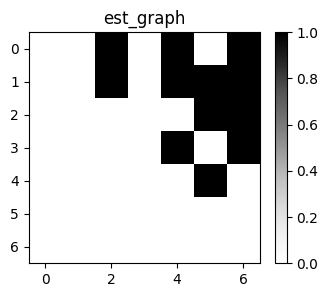

In [ ]:
# Visualize LLM-informed DAG
priori_dag = np.clip(priori_knowledge.matrix, 0, 1)
GraphDAG(est_dag=priori_dag)
plt.show()

In [ ]:
# # PC discovery without LLM assist
# pc = PC(variant='stable')
# pc.learn(scaled_data)

# # Create the inverse mapping from indices to variable names
# inverse_var_map = {v: k for k, v in all_vars.items()}

# # Replace the indices with variable names in the DAG matrix
# labels = [inverse_var_map[i] for i in range(pc.causal_matrix.shape[0])]
# pc_dag_named = pd.DataFrame(pc.causal_matrix, index=labels, columns=labels)

## **PC discovery with LLM Priori Knowledge**

In [ ]:
# Re-run PC with Priori Knowledge
pc_priori = PC(priori_knowledge=priori_knowledge, variant='stable')
pc_priori.learn(scaled_data)

# Replace the indices with variable names in the DAG matrix
labels_llm_informed = [inverse_var_map[i] for i in range(pc_priori.causal_matrix.shape[0])]
pc_dag_named_llm_informed = pd.DataFrame(pc_priori.causal_matrix, index=labels_llm_informed, columns=labels_llm_informed)

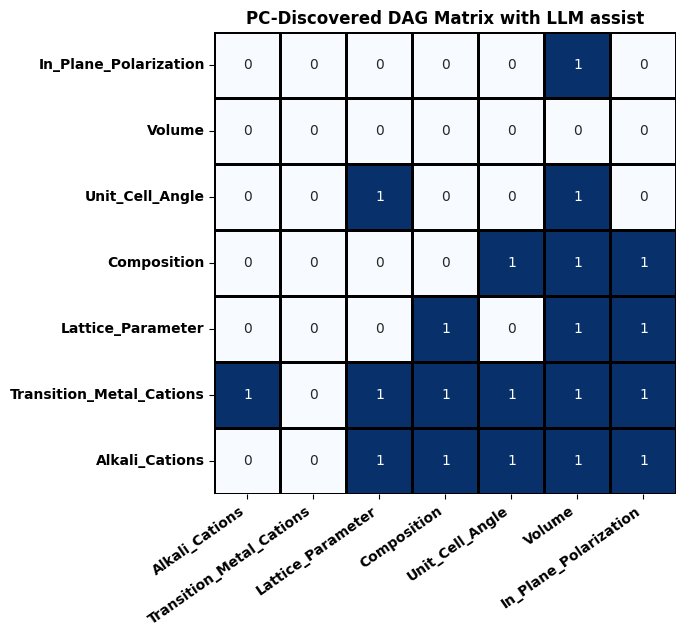

In [ ]:
# Plot the DAG matrix with names using seaborn heatmap
plt.figure(figsize=(6, 6))
sns.heatmap(pc_dag_named_llm_informed, annot=True, cmap='Blues', cbar=False, square=True, linewidths=.8, linecolor='black')
plt.title('PC-Discovered DAG Matrix with LLM assist', fontsize=12, fontweight='bold')
plt.xticks(rotation=35, ha='right', fontsize=10, fontweight='bold')
plt.yticks(fontsize=10, fontweight='bold')

# Invert the y-axis
plt.gca().invert_yaxis()

plt.show()

In [ ]:
 # Example DAG matrix (Replace this with your real data)
# pc_dag_real = np.array([
#     [0, 0, 1, 0, 1, 1, 1],
#     [0, 0, 1, 1, 1, 1, 1],
#     [0, 0, 0, 1, 0, 1, 1],
#     [0, 0, 0, 0, 1, 1, 1],
#     [0, 0, 1, 0, 0, 1, 0],
#     [1, 0, 0, 0, 0, 0, 0],
#     [0, 0, 0, 1, 0, 1, 0]
# ])

# # Plot the DAG matrix with real names using seaborn heatmap
# plt.figure(figsize=(6, 6), dpi = 1000)
# sns.heatmap(
#     pc_dag_real,
#     annot=True,
#     cmap=sns.color_palette(["white", "lightblue"]),  # Custom color for 1 values
#     cbar=False,  # No color bar since it's binary
#     square=True,
#     xticklabels=inverse_var_map_real.values(),
#     yticklabels=inverse_var_map_real.values(),
#     linewidths=.5,
#     linecolor='black',
#     annot_kws={"size": 10, "weight": "bold"},
#     fmt='d'
# )
# # plt.title('PC-Discovered DAG', fontsize=12, fontweight='bold')
# plt.xticks(rotation=0, ha='right', fontsize=14, fontweight='bold')
# plt.yticks(rotation=0, fontsize=14, fontweight='bold')

# # Invert the y-axis
# plt.gca().invert_yaxis()

# plt.show()

## LiNGAM

**Results**

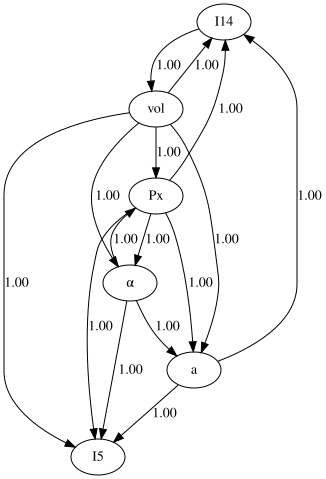

In [ ]:
pc_dag_real = np.array([
    [0, 0, 1, 0,  1, 1],
    [0, 0, 1, 1,  1, 1],
    [0, 0, 0, 1,  1, 1],
    [0, 0, 0, 0,  1, 1],
    [1, 0, 0, 0,  0, 0],
    [0, 0, 0, 1,  1, 0]
])

make_dot(pc_dag_real, labels=['I14', 'I5', 'a',  'α', 'vol', 'Px'])


In [ ]:
# Define the adjacency matrix
pc_dag_real = np.array([
    [0, 0, 1, 0,  1, 1],
    [0, 0, 1, 1,  1, 1],
    [0, 0, 0, 1,  1, 1],
    [0, 0, 0, 0,  1, 1],
    [1, 0, 0, 0,  0, 0],
    [0, 0, 0, 1,  1, 0]
])

# Define node labels
labels =['$I_{14}$', '$I_5$', '$P_x$',  'a',  'α', 'Vol']

# Create a graph
graph = pydot.Dot(graph_type='digraph')

# Add nodes
for i, label in enumerate(labels):
    node = pydot.Node(label)
    graph.add_node(node)

# Add edges
for i in range(pc_dag_real.shape[0]):
    for j in range(pc_dag_real.shape[1]):
        if pc_dag_real[i, j] == 1:
            edge = pydot.Edge(labels[i], labels[j])
            graph.add_edge(edge)

# Save or display the graph
graph.write_png('dag.png')  # Save as PNG
graph.write_svg('dag.svg')  # Save as SVG

## **LLM-Integrated Prior Knowledge for synthesis**

**Future Direction**

In [ ]:
# Create a directed graph
G = nx.DiGraph()

# Define nodes
growth_parameters = [
    "Laser Energy", "Repetition Rate", "Target Composition",
    "Substrate Temperature", "Substrate Orientation", "Ambient Gas Pressure",
    "Vacuum Level", "Deposition Rate", "Film Thickness", "Cooling Rate"
]

material_properties = [
    "Polarization", "Film Chemistry", "Defects", "Phase Purity",
    "Structural Stability", "Unit Cell Angle", "Lattice Parameter",
    "In-Plane Polarization", "Volume"
]

# Add nodes for parameters and properties
G.add_nodes_from(growth_parameters, type="Growth Parameter")
G.add_nodes_from(material_properties, type="Material Property")

# Simulated edges with causal relationships
np.random.seed(12)
edges = [
    (growth, property_)
    for growth in growth_parameters
    for property_ in material_properties
    if np.random.rand() > 0.7
    # Randomly assign edges with a threshold
]

# Add edges to the graph
G.add_edges_from(edges)

# Compute circular layouts for different groups
outer_circle = nx.circular_layout(growth_parameters)  # Growth parameters in outer ring
inner_circle = nx.circular_layout(material_properties)  # Material properties in center

# Scale inner circle to make it appear smaller
scaling_factor = 0.5  # Adjust for a smaller central ring
for node in inner_circle:
    inner_circle[node] *= scaling_factor  # Reduce positions to stay at the center

# Combine positions
pos = {**outer_circle, **inner_circle}

# Plot
plt.figure(figsize=(12, 12), dpi=2000)

# Assign colors
node_colors = ["skyblue" if G.nodes[n]["type"] == "Growth Parameter" else "lightgreen" for n in G.nodes]

nx.draw(
    G,
    pos,
    with_labels=True,
    node_size=4000,
    font_size=12,
    node_color=node_colors,
    edge_color="gray",
    arrowsize=25,
    font_weight="bold"
)

# Add a legend
growth_patch = plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="skyblue", markersize=10, label="Growth Parameter")
property_patch = plt.Line2D([0], [0], marker="o", color="w", markerfacecolor="lightgreen", markersize=10, label="Material Property")

plt.show()


## **Figures**

In [ ]:
# Step 1: Fully connected graph (initialization)
variables = ['$I_{14}$', '$I_5$', '$P_x$',  'a', 'c', 'α', 'Vol']
G_fully_connected = nx.complete_graph(len(variables))
G_fully_connected = nx.relabel_nodes(G_fully_connected, dict(enumerate(variables)))

# Step 2: Skeleton after conditional independence tests
edges_skeleton = [
    ('$I_{14}$', '$I_5$'), ('$I_{14}$', 'a'), ('$I_5$', 'c'), ('$P_x$', 'a'), ('a', 'Vol'), ('c', 'Vol')
]
G_skeleton = nx.Graph()
G_skeleton.add_nodes_from(variables)
G_skeleton.add_edges_from(edges_skeleton)

# Step 3: Oriented DAG after v-structures and rules without $P_y$
edges_oriented = [
    ('$I_{14}$', 'a'), ('Vol', '$I_5$'), ('$I_5$', 'c'), ('$P_x$', 'a'), ('a', 'Vol'), ('c', 'Vol')
]
G_oriented = nx.DiGraph()
G_oriented.add_nodes_from(variables)
G_oriented.add_edges_from(edges_oriented)

In [ ]:
# Adjacency matrix defining the actual connections based on the provided data
pc_dag_real = [
    [0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0],
    [0, 1, 0, 0, 0, 0],
    [0, 1, 0, 0, 0, 0],
    [1, 1, 1, 0, 0, 1],
    [0, 1, 1, 1, 0, 0]
]
pc_dag_real = list(map(list, zip(*pc_dag_real)))

# Variables
variables = ['$I_{14}$', '$I_5$', 'a',  'α', 'Vol', '$P_x$']

# Step 1: Fully connected graph
G_fully_connected = nx.complete_graph(len(variables))
G_fully_connected = nx.relabel_nodes(G_fully_connected, dict(enumerate(variables)))

# Step 2: Skeleton based on the adjacency matrix
edges_skeleton = [(variables[i], variables[j]) for i in range(len(pc_dag_real))
                  for j in range(len(pc_dag_real)) if pc_dag_real[i][j] == 1]
G_skeleton = nx.Graph()
G_skeleton.add_nodes_from(variables)
G_skeleton.add_edges_from(edges_skeleton)

# Step 3: Oriented DAG based on the adjacency matrix
edges_oriented = [(variables[i], variables[j]) for i in range(len(pc_dag_real))
                  for j in range(len(pc_dag_real)) if pc_dag_real[i][j] == 1]
G_oriented = nx.DiGraph()
G_oriented.add_nodes_from(variables)
G_oriented.add_edges_from(edges_oriented)

In [ ]:
# Updated function to add a border to the nodes
def plot_graph_with_border(graph, title, pos):
    plt.figure(figsize=(10, 10), dpi= 100)
    nx.draw(
        graph,
        pos,
        with_labels=True,
        node_size=7000,
        node_color="lightgreen",
        font_size=40,
        font_weight="bold",
        arrowsize=50,
        edgecolors="black"  # Adds a black border to the nodes
    )
    plt.title(title, fontsize=14)
    plt.show()

# Adjust positions for horizontal alignment
# pos_horizontal = nx.spring_layout(G_fully_connected, seed=32)  # Fix seed for consistent layout
pos_adjusted = nx.spring_layout(G_fully_connected, seed=42, k=1.2, iterations=50)  # Adjusted spring layout parameters

# Plot the graphs with borders around nodes
# plot_graph_with_border(G_fully_connected, " ", pos_adjusted)
# plot_graph_with_border(G_skeleton, " ", pos_adjusted)
plot_graph_with_border(G_oriented, " ", pos_adjusted)
